In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize']=8,3
sns.set_theme(style="whitegrid", palette="dark")

In [2]:
smok=pd.read_csv(r'C:\Users\admin\Downloads\archive\smoking_cancer_dataset.csv')

In [3]:
smok

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,NaN,NaN,22,NaN,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,NaN,NaN,84,NaN,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,NaN,NaN,47,NaN,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,NaN,NaN,51,NaN,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,NaN,NaN,18,NaN,Deceased,29.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,44,Female,Former,10,36,Moderate,Heavy,29.4,Low,...,Yes,Yes,Yes,Yes,Mouth,NaN,62,Surgery,Deceased,13.1
2996,2997,51,Female,Never,0,0,Low,Light,22.8,Moderate,...,Yes,Yes,Yes,Yes,NaN,NaN,50,NaN,Alive,8.6
2997,2998,61,Other,Former,10,47,Low,Heavy,38.2,Low,...,No,Yes,Yes,Yes,NaN,NaN,78,NaN,Deceased,23.6
2998,2999,85,Female,Never,0,0,High,NaN,19.4,Low,...,No,No,No,Yes,NaN,NaN,89,NaN,Deceased,12.3


In [4]:
smok.shape

(3000, 24)

In [5]:
smok.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Patient_ID                    3000 non-null   int64  
 1   Age                           3000 non-null   int64  
 2   Gender                        3000 non-null   object 
 3   Smoking_Status                3000 non-null   object 
 4   Cigarettes_Per_Day            3000 non-null   int64  
 5   Years_Smoking                 3000 non-null   int64  
 6   Exposure_to_Secondhand_Smoke  3000 non-null   object 
 7   Alcohol_Consumption           2276 non-null   object 
 8   BMI                           3000 non-null   float64
 9   Physical_Activity_Level       3000 non-null   object 
 10  Diet_Quality                  3000 non-null   object 
 11  Family_History_Cancer         3000 non-null   object 
 12  Air_Pollution_Exposure        3000 non-null   object 
 13  Occ

In [6]:
categorical_cols = ['Alcohol_Consumption', 'Occupational_Hazard_Exposure',
                    'Cancer_Type', 'Cancer_Stage', 'Treatment_Type']

for col in categorical_cols:
    smok[col] = smok[col].fillna(smok[col].mode()[0])

print(smok.isnull().sum())


Patient_ID                      0
Age                             0
Gender                          0
Smoking_Status                  0
Cigarettes_Per_Day              0
Years_Smoking                   0
Exposure_to_Secondhand_Smoke    0
Alcohol_Consumption             0
BMI                             0
Physical_Activity_Level         0
Diet_Quality                    0
Family_History_Cancer           0
Air_Pollution_Exposure          0
Occupational_Hazard_Exposure    0
Chronic_Cough                   0
Shortness_of_Breath             0
Fatigue                         0
Chest_Pain                      0
Cancer_Type                     0
Cancer_Stage                    0
Diagnosis_Age                   0
Treatment_Type                  0
Survival_Status                 0
Survival_Years                  0
dtype: int64


In [7]:
smok.columns

Index(['Patient_ID', 'Age', 'Gender', 'Smoking_Status', 'Cigarettes_Per_Day',
       'Years_Smoking', 'Exposure_to_Secondhand_Smoke', 'Alcohol_Consumption',
       'BMI', 'Physical_Activity_Level', 'Diet_Quality',
       'Family_History_Cancer', 'Air_Pollution_Exposure',
       'Occupational_Hazard_Exposure', 'Chronic_Cough', 'Shortness_of_Breath',
       'Fatigue', 'Chest_Pain', 'Cancer_Type', 'Cancer_Stage', 'Diagnosis_Age',
       'Treatment_Type', 'Survival_Status', 'Survival_Years'],
      dtype='object')

In [8]:
len(smok.columns)

24

In [9]:
smok.dtypes

Patient_ID                        int64
Age                               int64
Gender                           object
Smoking_Status                   object
Cigarettes_Per_Day                int64
Years_Smoking                     int64
Exposure_to_Secondhand_Smoke     object
Alcohol_Consumption              object
BMI                             float64
Physical_Activity_Level          object
Diet_Quality                     object
Family_History_Cancer            object
Air_Pollution_Exposure           object
Occupational_Hazard_Exposure     object
Chronic_Cough                    object
Shortness_of_Breath              object
Fatigue                          object
Chest_Pain                       object
Cancer_Type                      object
Cancer_Stage                     object
Diagnosis_Age                     int64
Treatment_Type                   object
Survival_Status                  object
Survival_Years                  float64
dtype: object

In [10]:
smok.describe()

,Patient_ID,Age,Cigarettes_Per_Day,Years_Smoking,BMI,Diagnosis_Age,Survival_Years
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,1500.500000,52.891000,5.124000,12.633667,25.015867,52.776333,15.062567
std,866.169729,20.684448,5.543302,16.233791,4.860176,20.592984,8.612171
min,1.000000,18.000000,0.000000,0.000000,9.700000,18.000000,0.000000
25%,750.750000,35.000000,0.000000,0.000000,21.700000,35.000000,7.700000
50%,1500.500000,52.000000,3.000000,0.000000,24.950000,53.000000,15.100000
75%,2250.250000,71.000000,10.000000,26.000000,28.325000,71.000000,22.600000
max,3000.000000,89.000000,20.000000,49.000000,41.600000,89.000000,30.000000


In [11]:
smok.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Patient_ID,3000.0,1500.500000,866.169729,1.0,750.75,1500.50,2250.250,3000.0
Age,3000.0,52.891000,20.684448,18.0,35.00,52.00,71.000,89.0
Cigarettes_Per_Day,3000.0,5.124000,5.543302,0.0,0.00,3.00,10.000,20.0
Years_Smoking,3000.0,12.633667,16.233791,0.0,0.00,0.00,26.000,49.0
BMI,3000.0,25.015867,4.860176,9.7,21.70,24.95,28.325,41.6
Diagnosis_Age,3000.0,52.776333,20.592984,18.0,35.00,53.00,71.000,89.0
Survival_Years,3000.0,15.062567,8.612171,0.0,7.70,15.10,22.600,30.0


In [12]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


<Axes: xlabel='Age', ylabel='Density'>

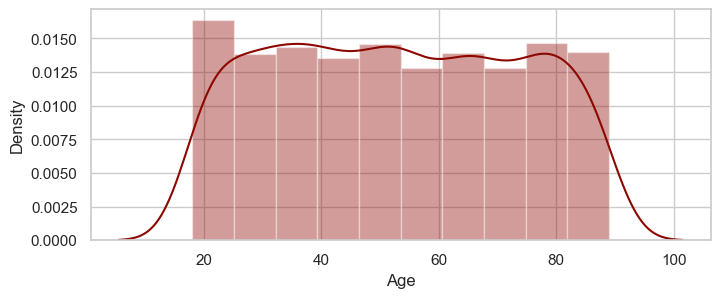

In [13]:
sns.distplot(smok.Age,color='r',bins=10)

<Axes: xlabel='Cigarettes_Per_Day', ylabel='Density'>

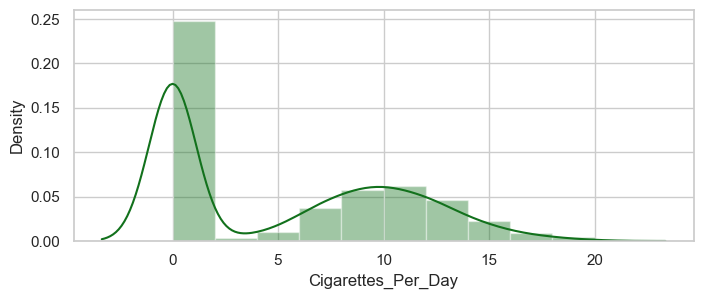

In [14]:
sns.distplot(smok.Cigarettes_Per_Day,color='g',bins=10)

<Axes: xlabel='Years_Smoking', ylabel='Density'>

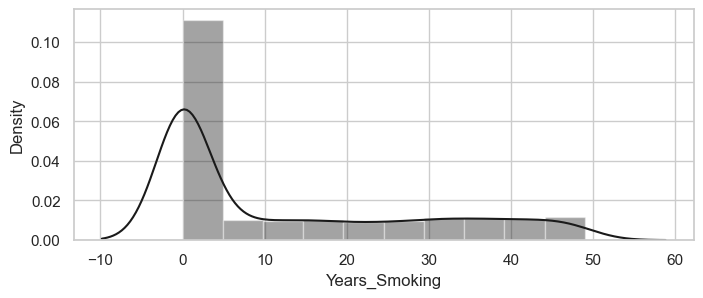

In [15]:
sns.distplot(smok.Years_Smoking,color='k',bins=10)

<Axes: xlabel='BMI', ylabel='Density'>

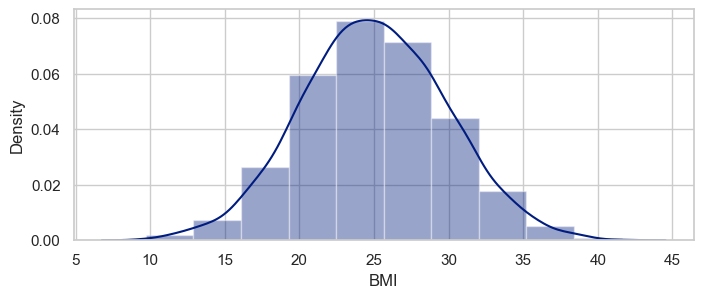

In [16]:
sns.distplot(smok.BMI,color='b',bins=10)

<Axes: xlabel='Diagnosis_Age', ylabel='Density'>

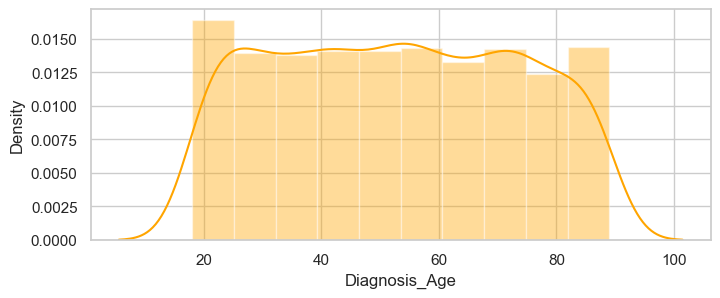

In [17]:
sns.distplot(smok.Diagnosis_Age,color='orange',bins=10)

<Axes: xlabel='Survival_Years', ylabel='Density'>

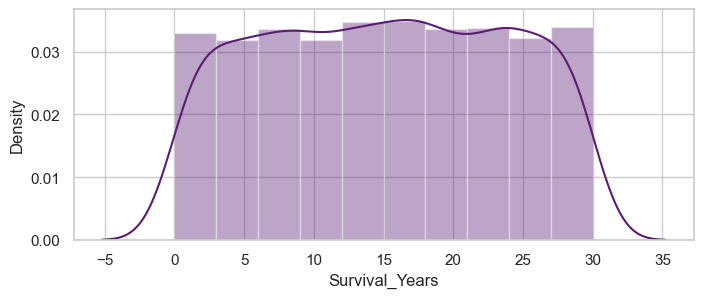

In [18]:
sns.distplot(smok.Survival_Years,color='m',bins=10)

In [19]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


<Axes: xlabel='Gender', ylabel='count'>

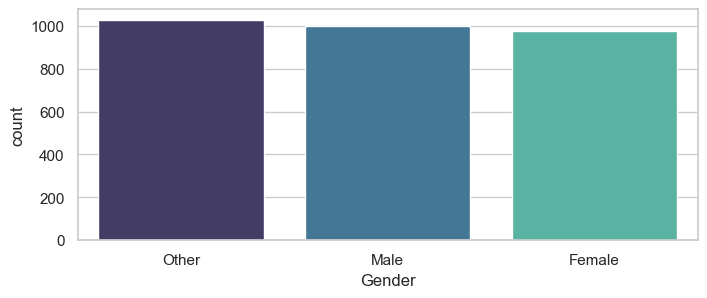

In [20]:
sns.countplot(data=smok,x='Gender',palette='mako')

<Axes: xlabel='Smoking_Status', ylabel='count'>

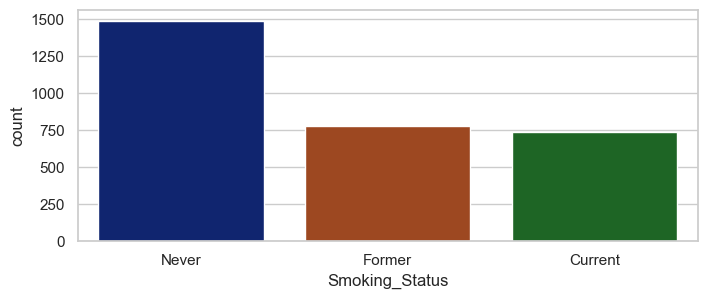

In [21]:
sns.countplot(data=smok,x='Smoking_Status',palette='dark')

<Axes: xlabel='Exposure_to_Secondhand_Smoke', ylabel='count'>

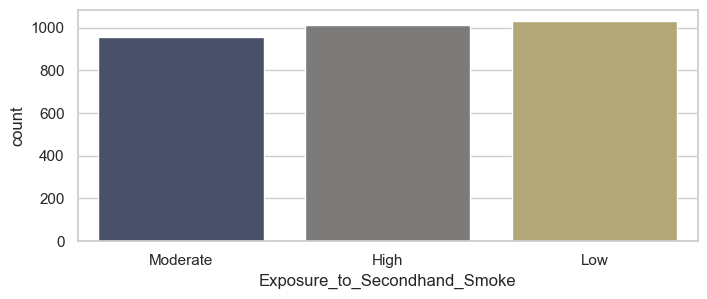

In [22]:
sns.countplot(data=smok,x='Exposure_to_Secondhand_Smoke',palette='cividis')

<Axes: xlabel='Alcohol_Consumption', ylabel='count'>

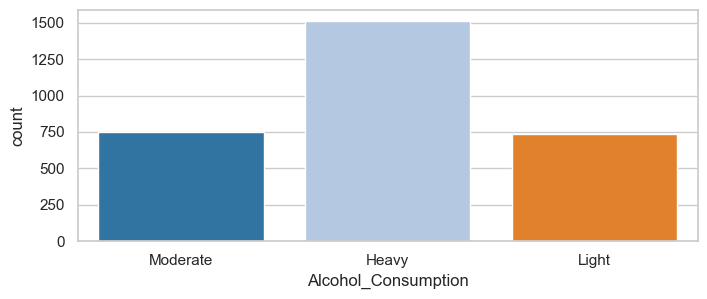

In [23]:
sns.countplot(data=smok,x='Alcohol_Consumption',palette='tab20')

<Axes: xlabel='Physical_Activity_Level', ylabel='count'>

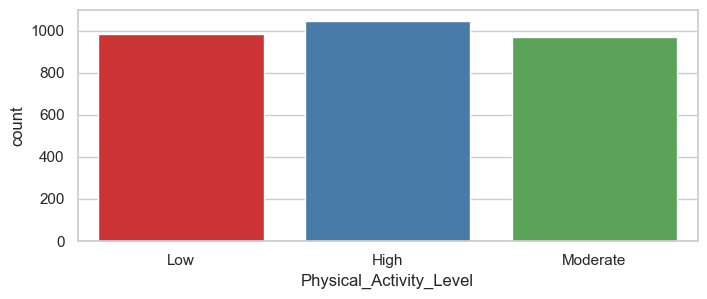

In [24]:
sns.countplot(data=smok,x='Physical_Activity_Level',palette='Set1')

<Axes: xlabel='Chronic_Cough', ylabel='count'>

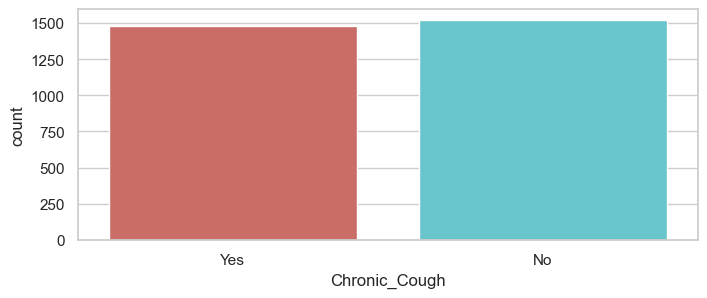

In [25]:
sns.countplot(data=smok,x='Chronic_Cough',palette='hls')

<Axes: xlabel='Cancer_Stage', ylabel='count'>

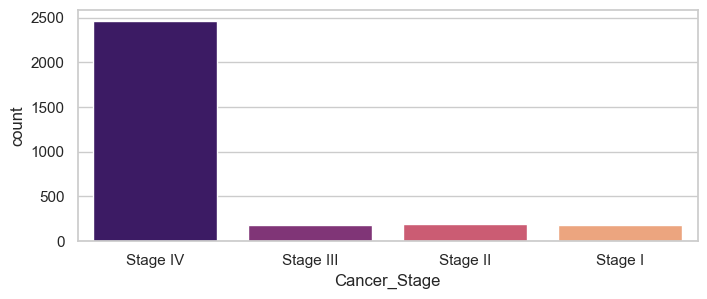

In [26]:
sns.countplot(data=smok,x='Cancer_Stage',palette='magma')

<Axes: xlabel='Cancer_Type', ylabel='count'>

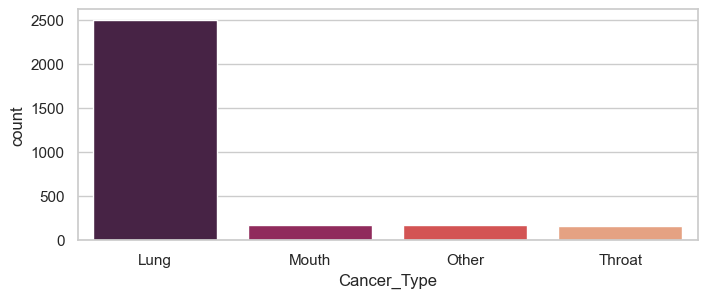

In [27]:
sns.countplot(data=smok,x='Cancer_Type',palette='rocket')

<Axes: xlabel='Treatment_Type', ylabel='count'>

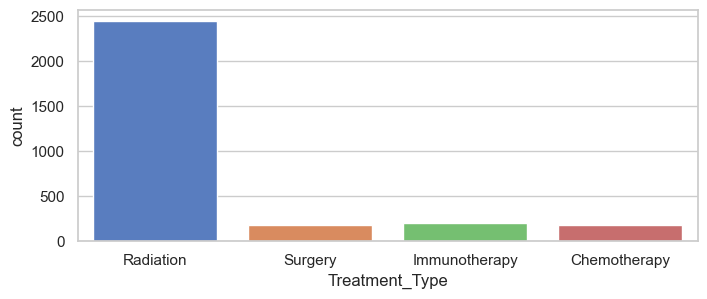

In [28]:
sns.countplot(data=smok,x='Treatment_Type',palette='muted')

<Axes: xlabel='Survival_Status', ylabel='count'>

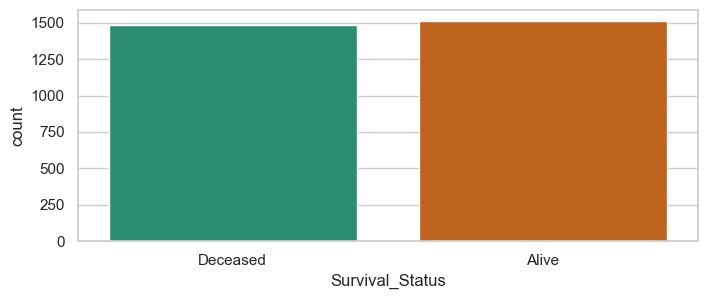

In [29]:
sns.countplot(data=smok,x='Survival_Status',palette='Dark2')

In [30]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


<Axes: xlabel='Gender', ylabel='count'>

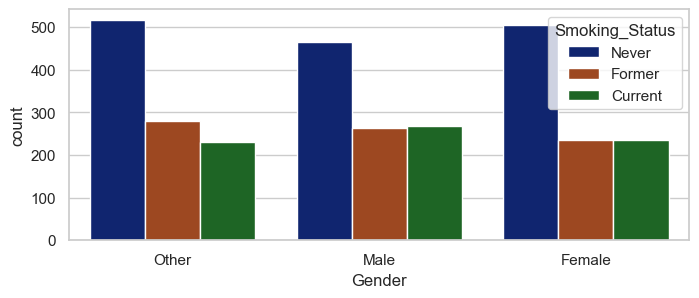

In [31]:
sns.countplot(data=smok,x='Gender',hue='Smoking_Status',palette='dark')

<Axes: xlabel='Exposure_to_Secondhand_Smoke', ylabel='count'>

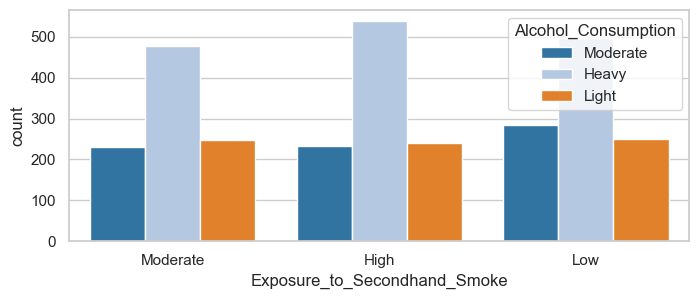

In [32]:
sns.countplot(data=smok,x='Exposure_to_Secondhand_Smoke',hue='Alcohol_Consumption',palette='tab20')

<Axes: xlabel='Physical_Activity_Level', ylabel='count'>

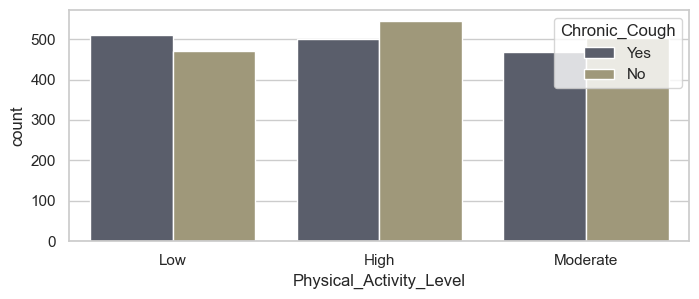

In [33]:
sns.countplot(data=smok,x='Physical_Activity_Level',hue='Chronic_Cough',palette='cividis')

<Axes: xlabel='Cancer_Type', ylabel='count'>

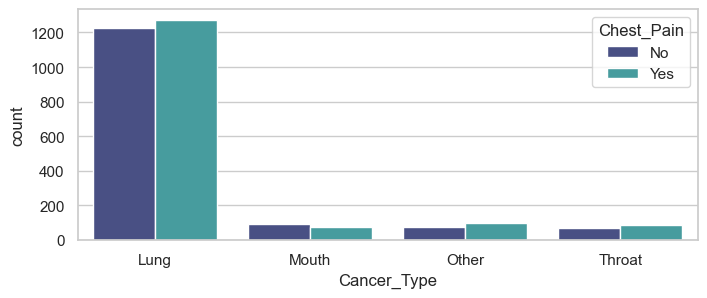

In [34]:
sns.countplot(data=smok,x='Cancer_Type',hue='Chest_Pain',palette='mako')

<Axes: xlabel='Cancer_Type', ylabel='count'>

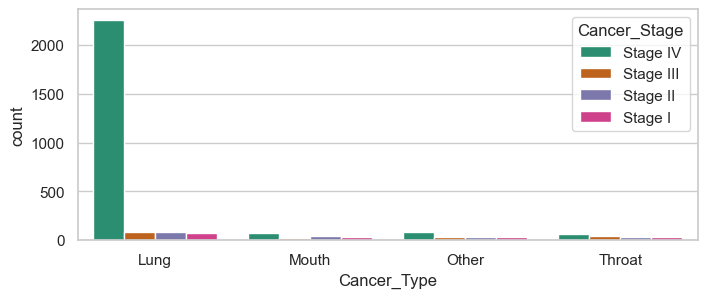

In [35]:
sns.countplot(data=smok,x='Cancer_Type',hue='Cancer_Stage',palette='Dark2')

<Axes: xlabel='Treatment_Type', ylabel='count'>

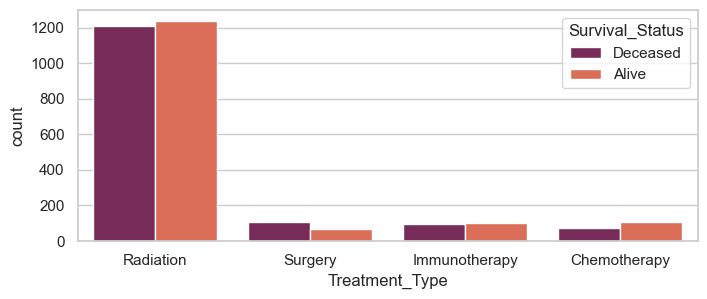

In [36]:
sns.countplot(data=smok,x='Treatment_Type',hue='Survival_Status',palette='rocket')

In [37]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


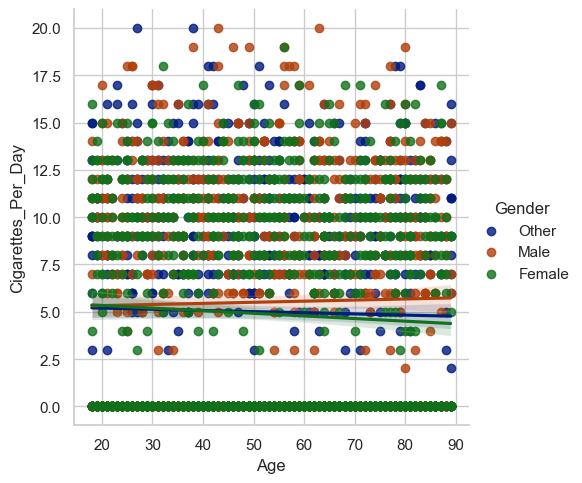

In [38]:
sns.lmplot(data=smok,x='Age',y='Cigarettes_Per_Day',palette='dark',hue='Gender')

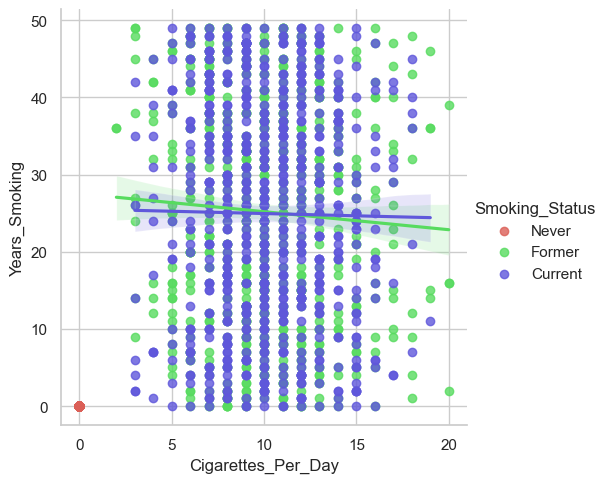

In [39]:
sns.lmplot(data=smok,x='Cigarettes_Per_Day',y='Years_Smoking',palette='hls',hue='Smoking_Status')

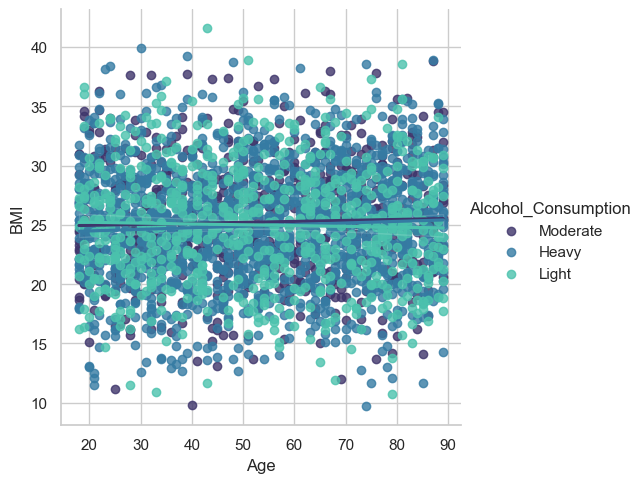

In [40]:
sns.lmplot(data=smok,x='Age',y='BMI',palette='mako',hue='Alcohol_Consumption')

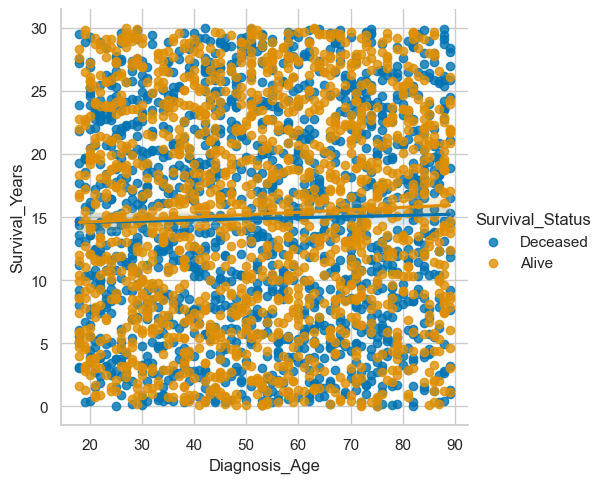

In [41]:
sns.lmplot(data=smok,x='Diagnosis_Age',y='Survival_Years',palette='colorblind',hue='Survival_Status')

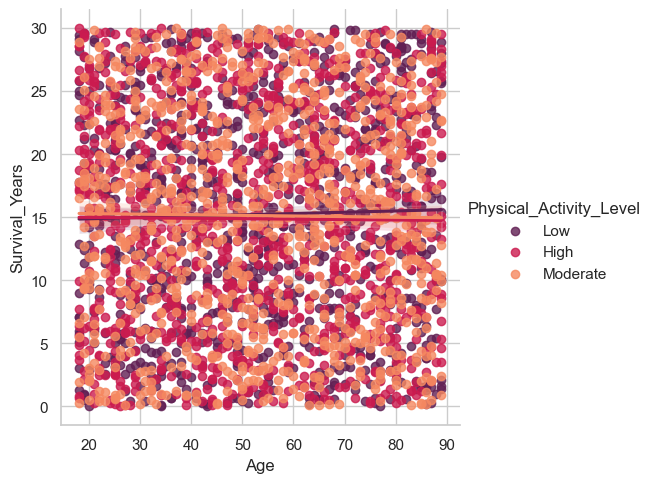

In [42]:
sns.lmplot(data=smok,x='Age',y='Survival_Years',palette='rocket',hue='Physical_Activity_Level')

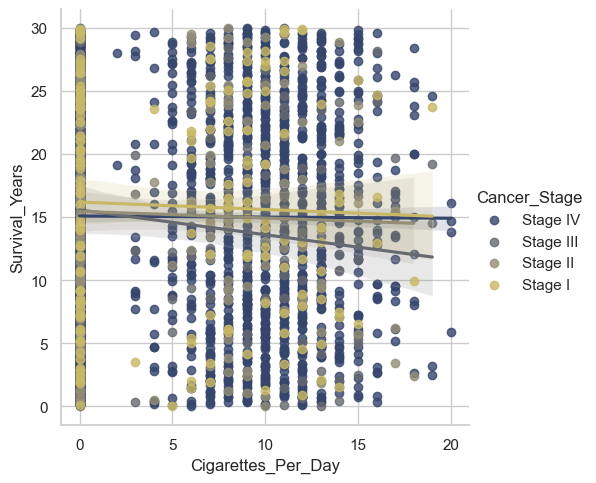

In [43]:
sns.lmplot(data=smok,x='Cigarettes_Per_Day',y='Survival_Years',palette='cividis',hue='Cancer_Stage')

In [44]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


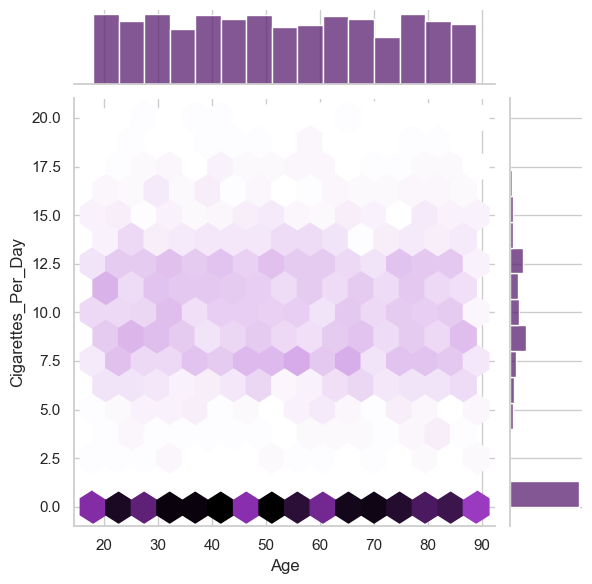

In [45]:
sns.jointplot(data=smok,x='Age',y='Cigarettes_Per_Day',color='m',kind='hex')

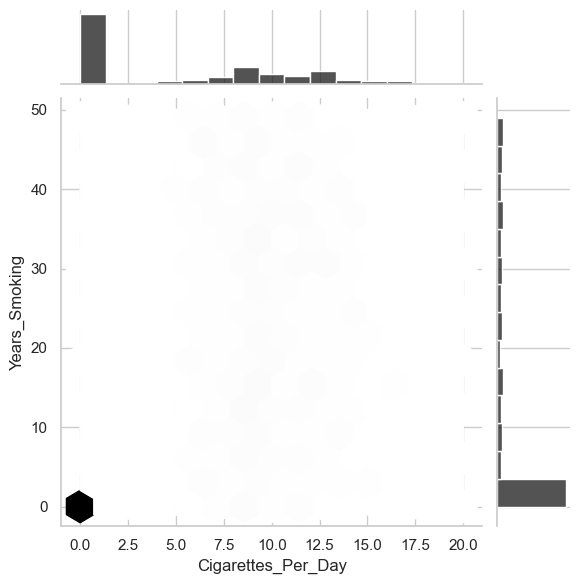

In [46]:
sns.jointplot(data=smok,x='Cigarettes_Per_Day',y='Years_Smoking',color='k',kind='hex')

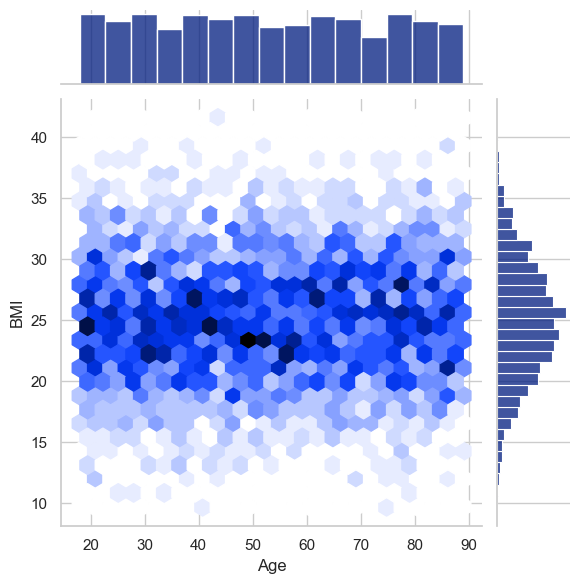

In [47]:
sns.jointplot(data=smok,x='Age',y='BMI',color='b',kind='hex')

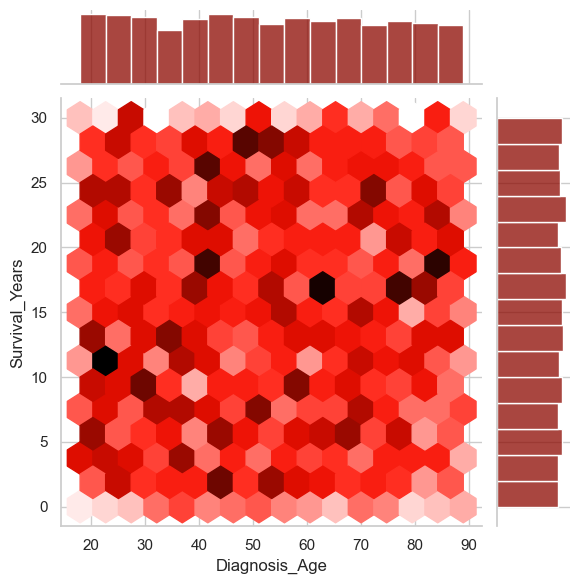

In [48]:
sns.jointplot(data=smok,x='Diagnosis_Age',y='Survival_Years',color='r',kind='hex')

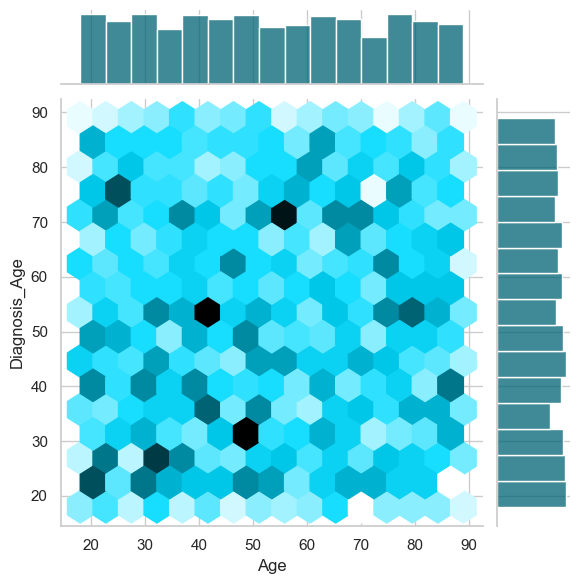

In [49]:
sns.jointplot(data=smok,x='Age',y='Diagnosis_Age',color='c',kind='hex')

In [50]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


<Axes: xlabel='Smoking_Status', ylabel='Age'>

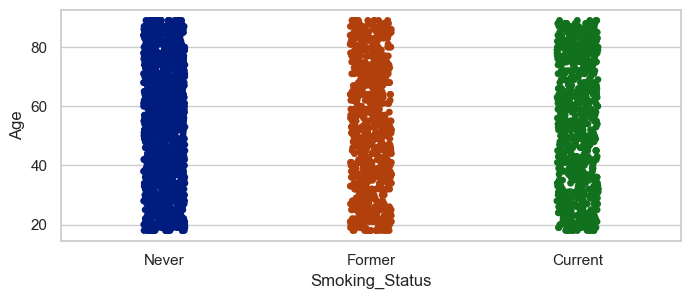

In [51]:
sns.stripplot(data=smok,x='Smoking_Status',y='Age',palette='dark')

<Axes: xlabel='Physical_Activity_Level', ylabel='Cigarettes_Per_Day'>

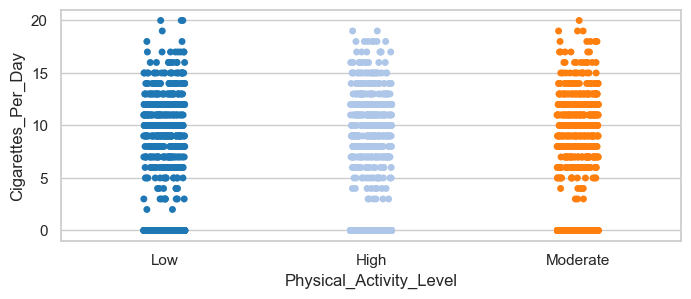

In [52]:
sns.stripplot(data=smok,x='Physical_Activity_Level',y='Cigarettes_Per_Day',palette='tab20')

<Axes: xlabel='Cancer_Type', ylabel='Years_Smoking'>

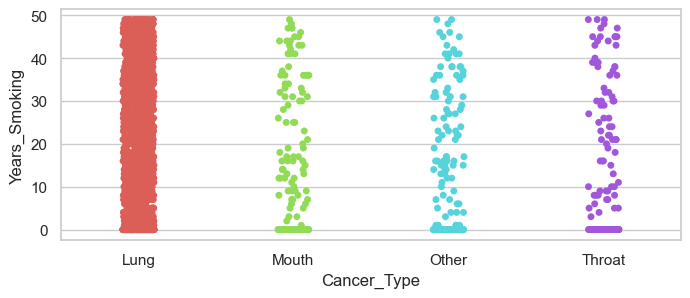

In [53]:
sns.stripplot(data=smok,x='Cancer_Type',y='Years_Smoking',palette='hls')

<Axes: xlabel='Cancer_Stage', ylabel='BMI'>

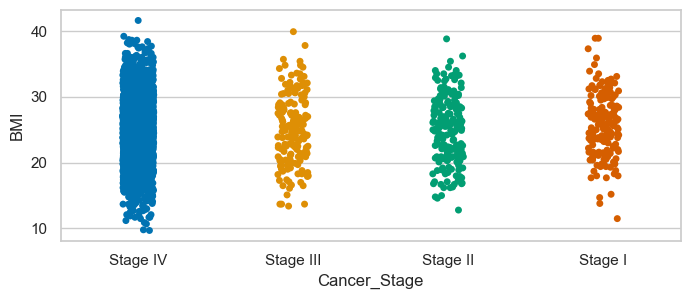

In [54]:
sns.stripplot(data=smok,x='Cancer_Stage',y='BMI',palette='colorblind')

<Axes: xlabel='Treatment_Type', ylabel='Diagnosis_Age'>

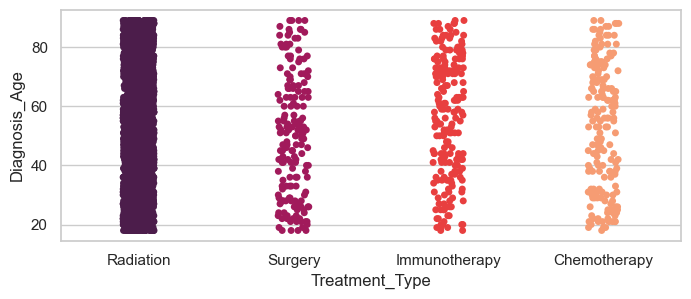

In [55]:
sns.stripplot(data=smok,x='Treatment_Type',y='Diagnosis_Age',palette='rocket')

<Axes: xlabel='Survival_Status', ylabel='Survival_Years'>

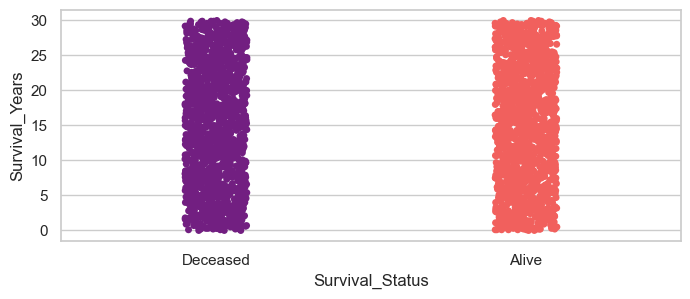

In [56]:
sns.stripplot(data=smok,x='Survival_Status',y='Survival_Years',palette='magma')

In [57]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


<Axes: xlabel='Smoking_Status', ylabel='Age'>

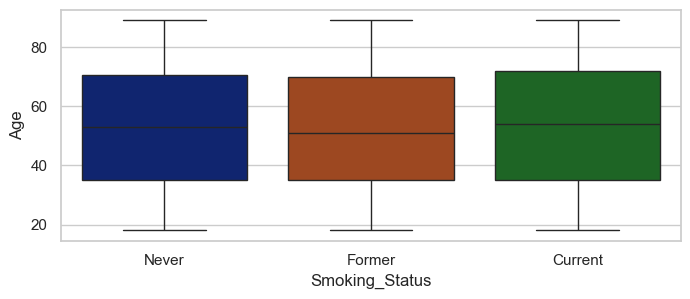

In [58]:
sns.boxplot(data=smok,x='Smoking_Status',y='Age',palette='dark')

<Axes: xlabel='Alcohol_Consumption', ylabel='Cigarettes_Per_Day'>

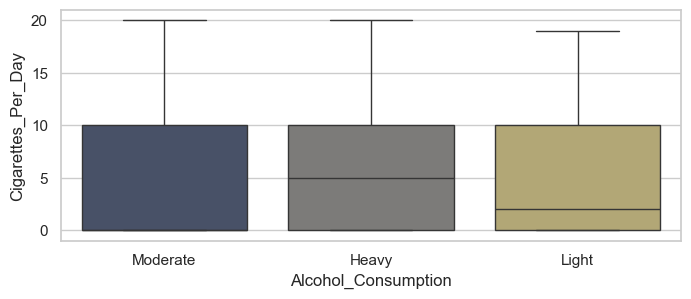

In [59]:
sns.boxplot(data=smok,x='Alcohol_Consumption',y='Cigarettes_Per_Day',palette='cividis')

<Axes: xlabel='Cancer_Type', ylabel='Years_Smoking'>

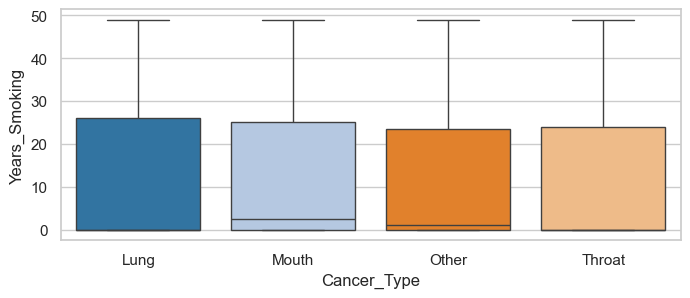

In [60]:
sns.boxplot(data=smok,x='Cancer_Type',y='Years_Smoking',palette='tab20')

<Axes: xlabel='Cancer_Stage', ylabel='BMI'>

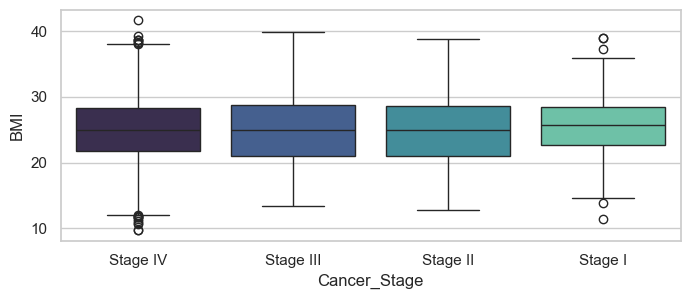

In [61]:
sns.boxplot(data=smok,x='Cancer_Stage',y='BMI',palette='mako')

<Axes: xlabel='Treatment_Type', ylabel='Diagnosis_Age'>

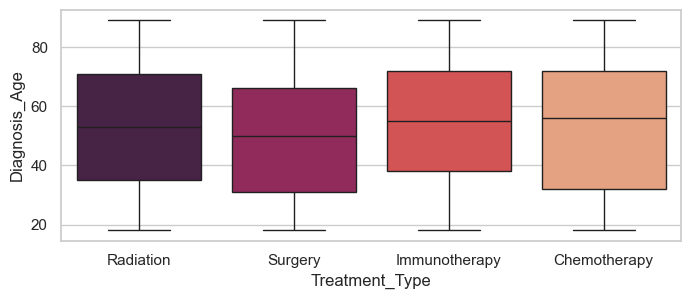

In [62]:
sns.boxplot(data=smok,x='Treatment_Type',y='Diagnosis_Age',palette='rocket')

<Axes: xlabel='Survival_Status', ylabel='Survival_Years'>

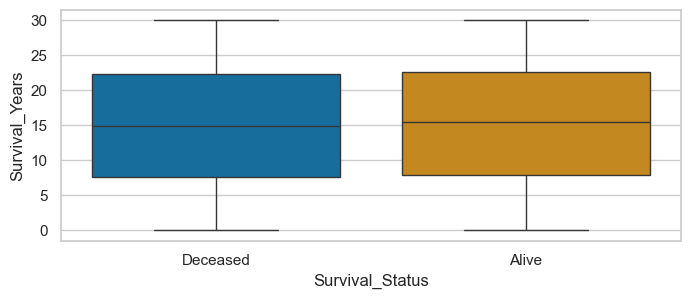

In [63]:
sns.boxplot(data=smok,x='Survival_Status',y='Survival_Years',palette='colorblind')

In [64]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


<Axes: xlabel='Age', ylabel='Density'>

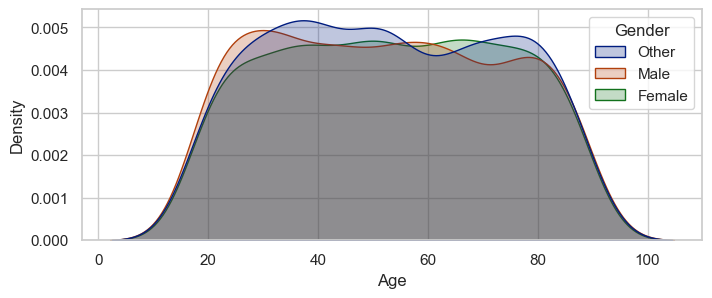

In [65]:
sns.kdeplot(data=smok,x='Age',hue='Gender',palette='dark',fill=True)

<Axes: xlabel='Cigarettes_Per_Day', ylabel='Density'>

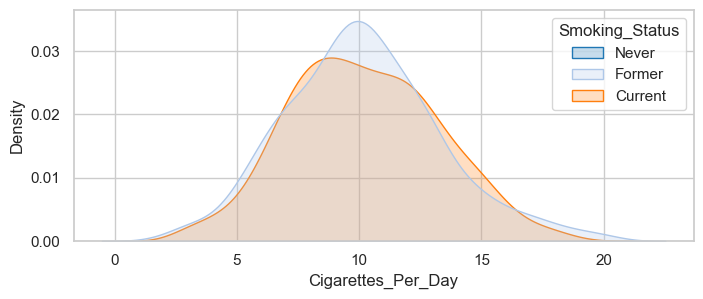

In [66]:
sns.kdeplot(data=smok,x='Cigarettes_Per_Day',hue='Smoking_Status',palette='tab20',fill=True)

<Axes: xlabel='Years_Smoking', ylabel='Density'>

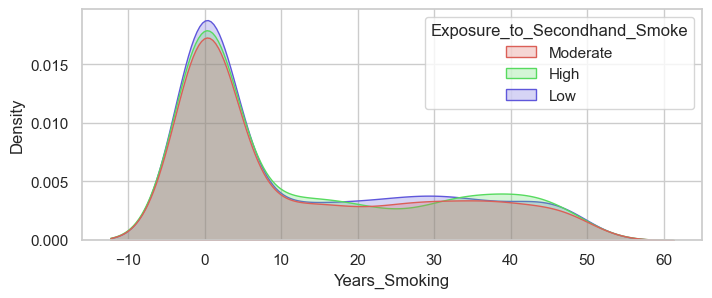

In [67]:
sns.kdeplot(data=smok,x='Years_Smoking',hue='Exposure_to_Secondhand_Smoke',palette='hls',fill=True)

<Axes: xlabel='BMI', ylabel='Density'>

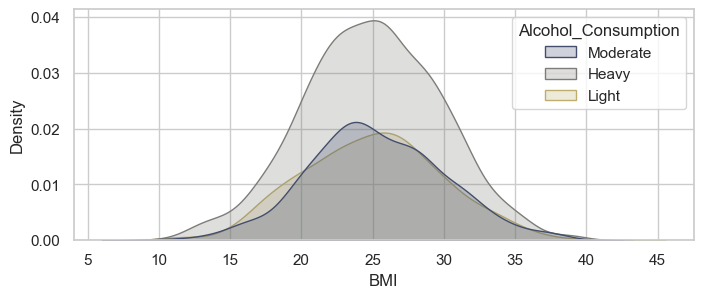

In [68]:
sns.kdeplot(data=smok,x='BMI',hue='Alcohol_Consumption',palette='cividis',fill=True)

<Axes: xlabel='Diagnosis_Age', ylabel='Density'>

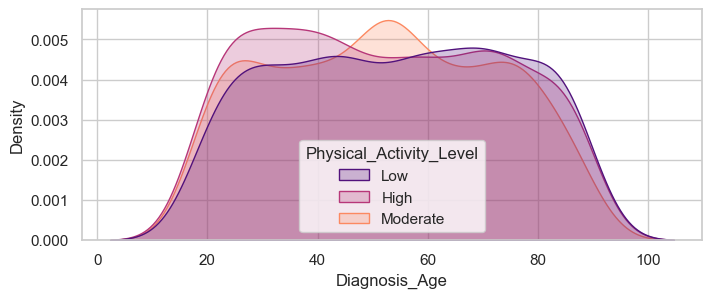

In [69]:
sns.kdeplot(data=smok,x='Diagnosis_Age',hue='Physical_Activity_Level',palette='magma',fill=True)

<Axes: xlabel='Survival_Years', ylabel='Density'>

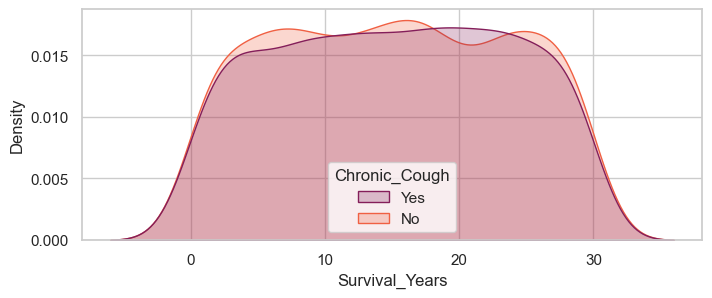

In [70]:
sns.kdeplot(data=smok,x='Survival_Years',hue='Chronic_Cough',palette='rocket',fill=True)

<Axes: xlabel='Age', ylabel='Density'>

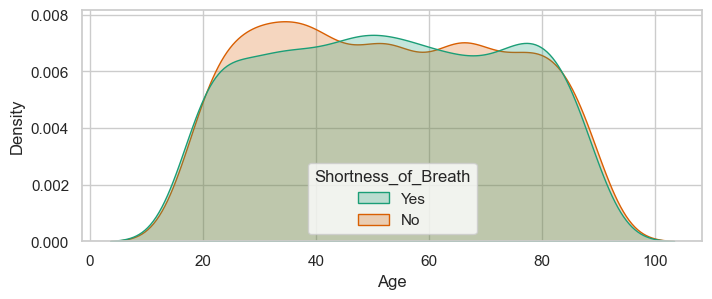

In [71]:
sns.kdeplot(data=smok,x='Age',hue='Shortness_of_Breath',palette='Dark2',fill=True)

<Axes: xlabel='Cigarettes_Per_Day', ylabel='Density'>

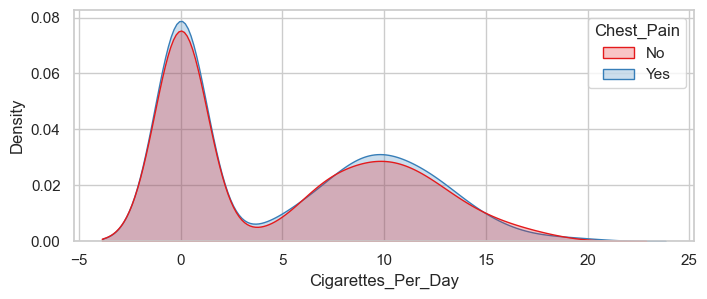

In [72]:
sns.kdeplot(data=smok,x='Cigarettes_Per_Day',hue='Chest_Pain',palette='Set1',fill=True)

<Axes: xlabel='Years_Smoking', ylabel='Density'>

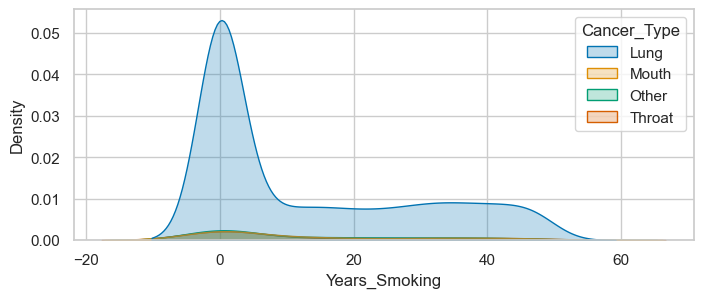

In [73]:
sns.kdeplot(data=smok,x='Years_Smoking',hue='Cancer_Type',palette='colorblind',fill=True)

<Axes: xlabel='Survival_Years', ylabel='Density'>

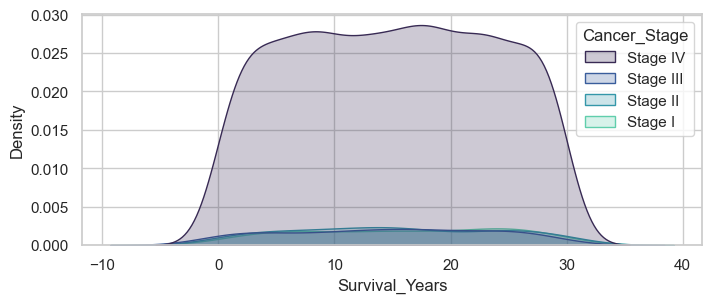

In [74]:
sns.kdeplot(data=smok,x='Survival_Years',hue='Cancer_Stage',palette='mako',fill=True)

<Axes: xlabel='Age', ylabel='Density'>

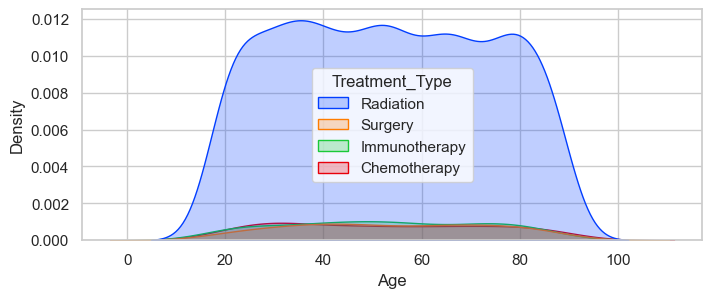

In [75]:
sns.kdeplot(data=smok,x='Age',hue='Treatment_Type',palette='bright',fill=True)

<Axes: xlabel='Survival_Years', ylabel='Density'>

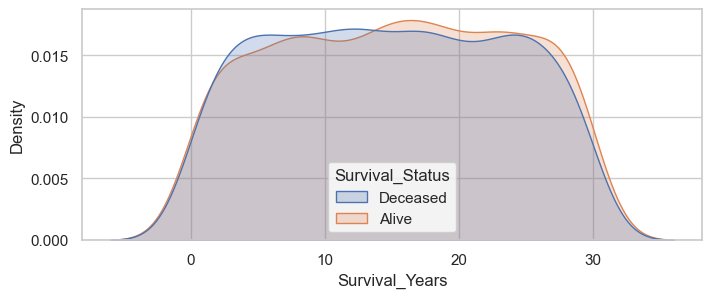

In [76]:
sns.kdeplot(data=smok,x='Survival_Years',hue='Survival_Status',palette='deep',fill=True)

In [77]:
smok.head()

,Patient_ID,Age,Gender,Smoking_Status,Cigarettes_Per_Day,Years_Smoking,Exposure_to_Secondhand_Smoke,Alcohol_Consumption,BMI,Physical_Activity_Level,...,Chronic_Cough,Shortness_of_Breath,Fatigue,Chest_Pain,Cancer_Type,Cancer_Stage,Diagnosis_Age,Treatment_Type,Survival_Status,Survival_Years
0,1,69,Other,Never,0,0,Moderate,Moderate,27.1,Low,...,Yes,Yes,No,No,Lung,Stage IV,22,Radiation,Deceased,23.4
1,2,32,Male,Never,0,0,Moderate,Heavy,24.6,Low,...,Yes,No,No,Yes,Lung,Stage IV,84,Radiation,Alive,4.3
2,3,89,Other,Former,11,44,High,Light,29.8,Low,...,Yes,Yes,No,Yes,Lung,Stage IV,47,Radiation,Alive,15.4
3,4,78,Male,Never,0,0,Low,Moderate,19.9,High,...,No,Yes,No,No,Lung,Stage IV,51,Radiation,Deceased,15.7
4,5,38,Female,Never,0,0,Moderate,Moderate,30.7,Moderate,...,Yes,Yes,No,Yes,Lung,Stage IV,18,Radiation,Deceased,29.5


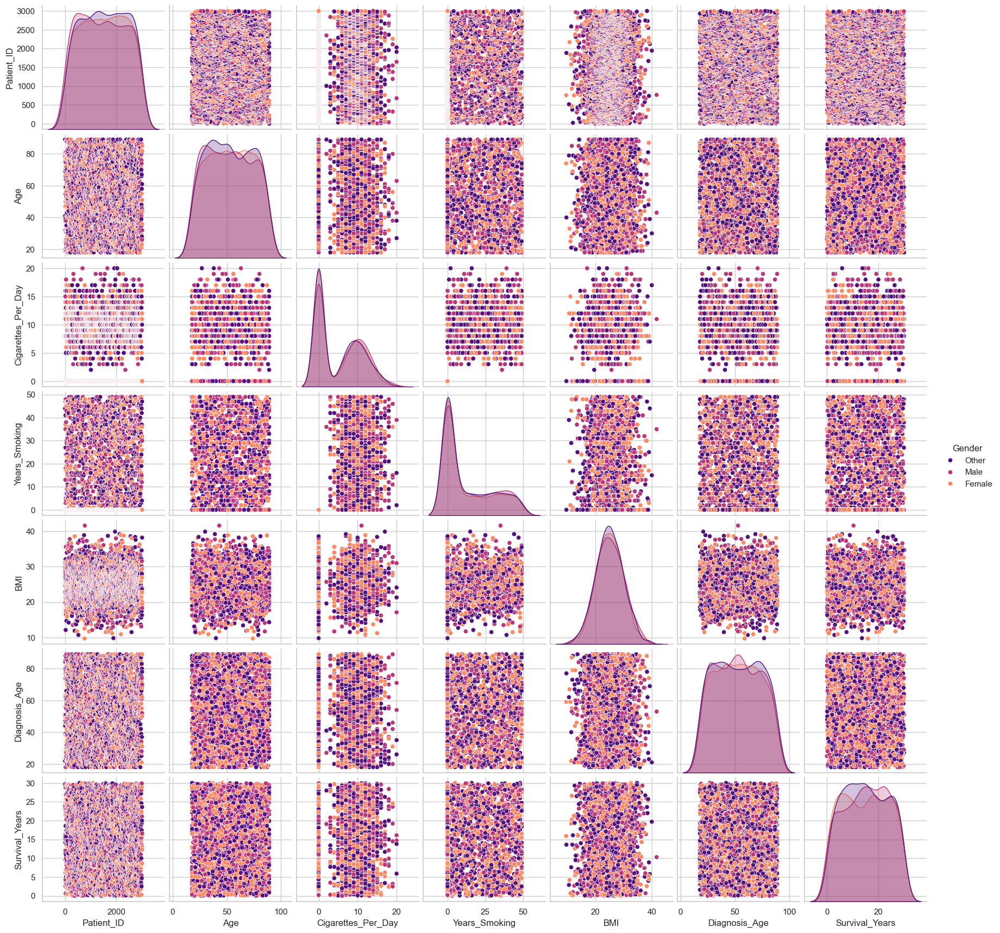

In [78]:
sns.pairplot(smok, hue="Gender",palette='magma')

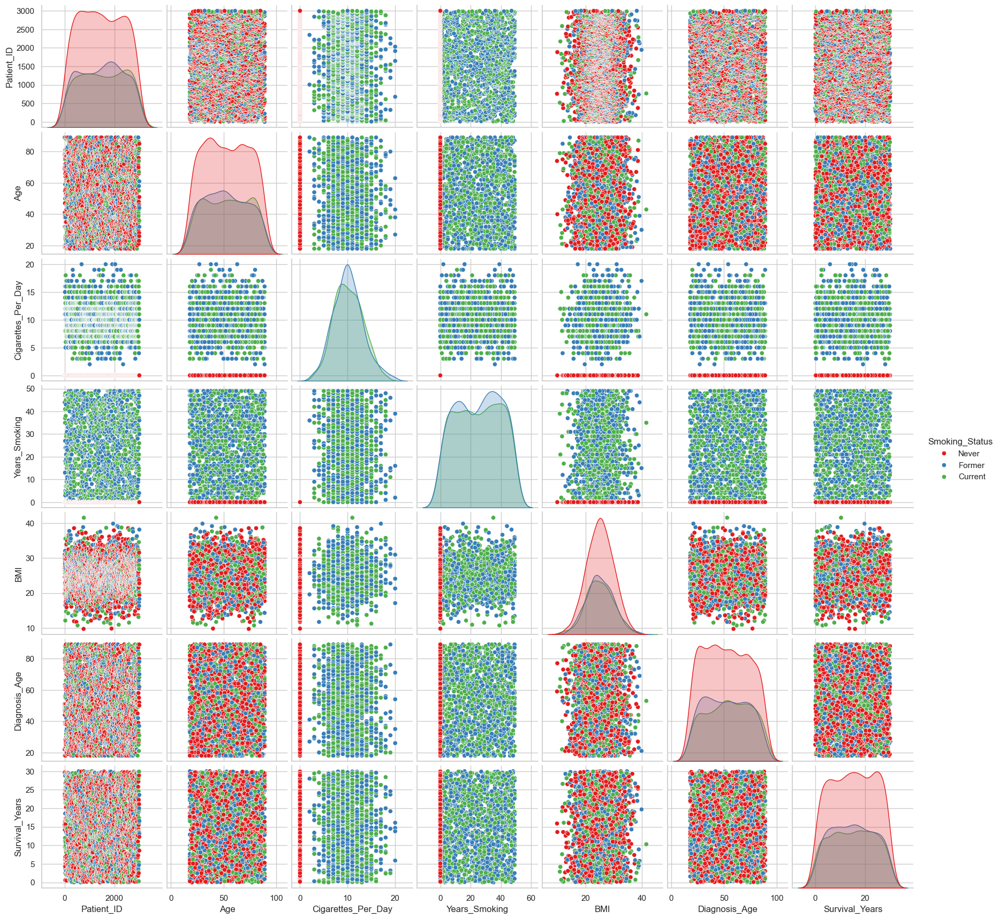

In [79]:
sns.pairplot(smok, hue="Smoking_Status",palette='Set1')

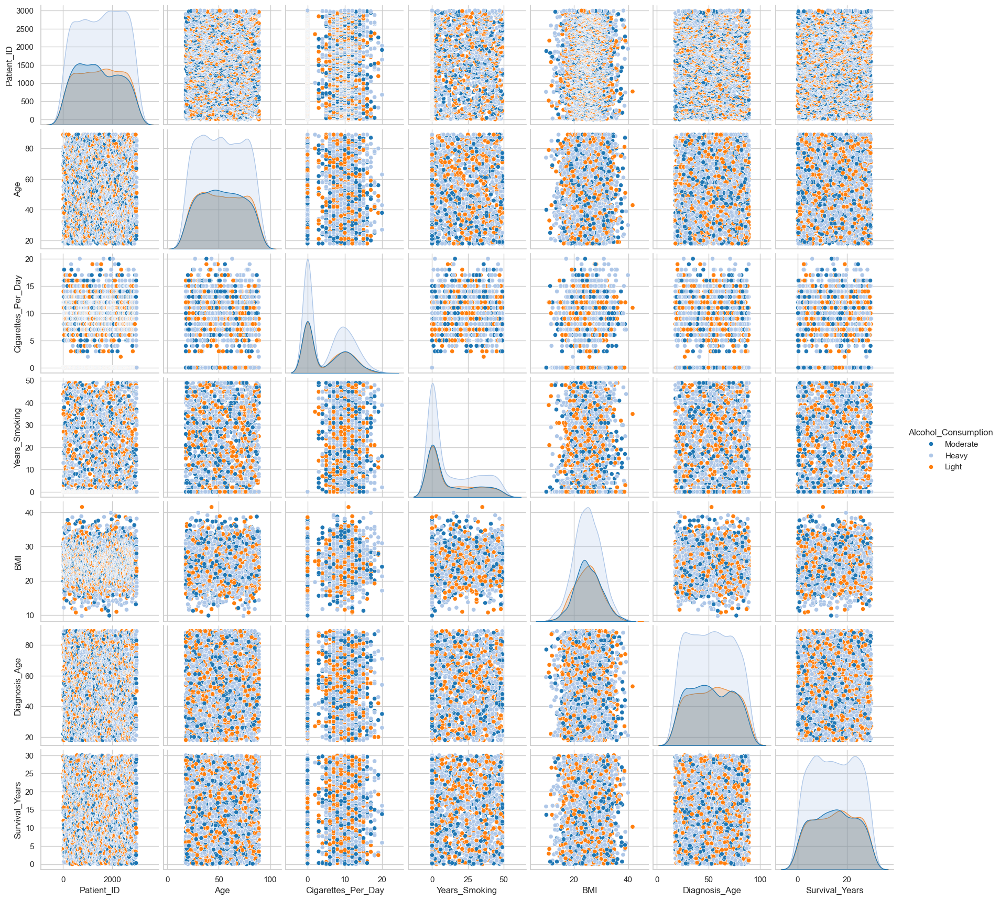

In [80]:
sns.pairplot(smok, hue="Alcohol_Consumption",palette='tab20')